# Daisyworld: 2D

In [1]:
# Import
import numpy as np
import matplotlib.pyplot as plt
import utils2d

In [2]:
# Define Parameters
L = 1.500  # Luminosity
ab = 0.25  # Black Daisy Albedo
aw = 0.75  # White Daisy Albedo
ag = 0.5  # Ground Albedo
R = 0.2  # Insulation Constant
S = 917  # Solar Constant
sigma = 5.67e-8  # Stefan-Boltzmann Constant
Ti = 22.5  # Ideal Growth Temperature
gamma = 0.3  # Death Rate

In [3]:
# dA/dt of Black Daisy
def vb(Ab, Aw, L):
    ap = Aw * aw + Ab * ab + (1 - Aw - Ab) * ag  # Planet Albedo
    Te = (L * (S / sigma) * (1 - ap)) ** 0.25  # Planet Temp
    Tb = (R * L * (S / sigma) * (ap - ab) + (Te ** 4)) ** 0.25  # Black Daisy Temp
    bb = 1 - (0.003265 * ((273.15 + Ti) - Tb) ** 2)  # Black Daisy Growth Rate
    return Ab * ((1 - Ab - Aw) * bb - gamma)

In [4]:
# dA/dt of White Daisy
def vw(Ab, Aw, L):
    ap = Aw * aw + Ab * ab + (1 - Aw - Ab) * ag  # Planet Albedo
    Te = (L * (S / sigma) * (1 - ap)) ** 0.25  # Planet Temp
    Tw = (R * L * (S / sigma) * (ap - aw) + (Te ** 4)) ** 0.25  # White Daisy Temp
    bw = 1 - (0.003265 * ((273.15 + Ti) - Tw) ** 2)  # White Daisy Growth Rate
    return Aw * ((1 - Aw - Ab) * bw - gamma)

### Time Iteration Picture

In [5]:
# Forward-Euler Trajectory
dt = 0.05
time = np.arange(0, 10, dt)

initial_Ab, initial_Aw = 0.33, 0.65
black_areas = np.zeros(len(time))
white_areas = np.zeros(len(time))

Ab, Aw = initial_Ab, initial_Aw
for i in range(len(time)):
    black_areas[i] = Ab
    white_areas[i] = Aw
    Ab += vb(Ab, Aw, L) * dt
    Aw += vw(Ab, Aw, L) * dt

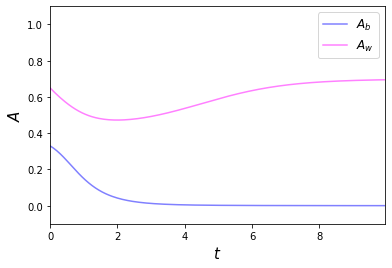

In [6]:
# Plot
data = (time, black_areas, white_areas)
utils2d.plot_time_iteration(data)

### Space State Picture

In [7]:
# Find dAb/dt and dAw/dt at every value of Ab and Aw
Aws, Abs = np.mgrid[0:1:100j, 0:1:100j]
vbs = vb(Abs, Aws, L)
vws = vw(Abs, Aws, L)

In [8]:
# Find equilibria
equilibria = utils2d.equilibrium(vb, vw, L)
print(equilibria)

([[0.0, 0.0], [0.0, 0.39286], [0.0, 0.69879]], ['Stable', 'Unstable', 'Stable'])


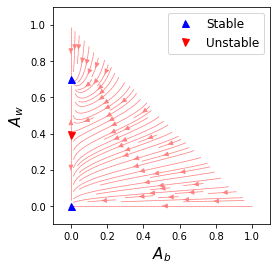

In [9]:
# Plot
data = (Abs, Aws, vbs, vws)
utils2d.plot_state_space(data, equilibria)

### Complete Picture

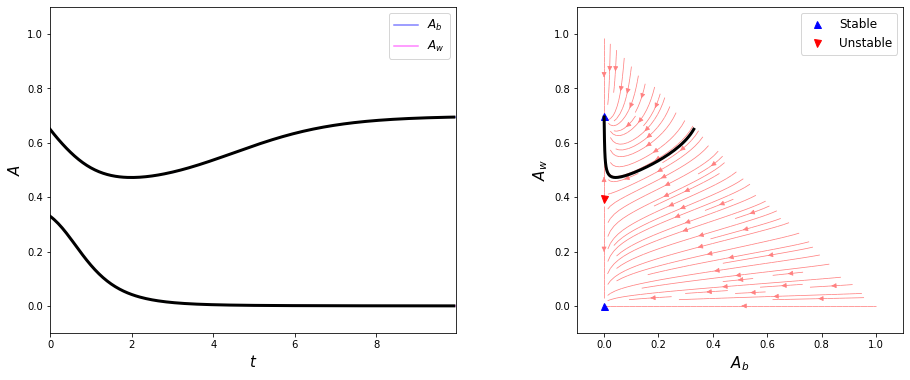

In [10]:
# Animated Comparison (try for different initial area values)
t_data = (time, black_areas, white_areas)
s_data = (Abs, Aws, vbs, vws)

ani = utils2d.animated_comparison(t_data, s_data, equilibria)

# Display
from IPython.display import HTML
HTML(ani.to_jshtml())

In [11]:
# Bifurcation Plot with respect to Luminosity
lumins = np.arange(0.5, 1.8, 0.02)
eqs = []
for l in lumins:
    eqs.append(utils2d.equilibrium(vb, vw, l))

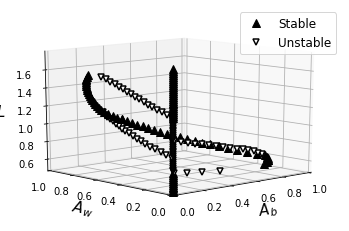

In [12]:
data = (lumins, eqs)
utils2d.plot_bifurcation(data, elev=12.5, azim=-132.5)